In [91]:
import numpy as np
import matplotlib.pyplot as plt
import librosa
import essentia
import essentia.standard as ess
import os



In [92]:
def read_file_paths_from_folder(folder):
    file_paths = []
    for root, dirs, files in os.walk(folder):
        for file in files:
            if file.endswith('.wav'):
                file_paths.append(os.path.join(root, file))
    return file_paths

def find_corresponding_files(file, target_folder):
    target_file = file.split('/')[-1]
    target_file = target_file.split('_')[0]
    corresponding_files = []
    for root, dirs, files in os.walk(target_folder):
        for f in files:
            if f.startswith(target_file):
                corresponding_files.append(os.path.join(root, f))
    return corresponding_files

def init_descriptors(sr = 44100):
    spectrum = ess.Spectrum()
    melbands = ess.MelBands(numberBands=128, sampleRate=sr)
    spectral_complexity = ess.SpectralComplexity()
    spectral_centroid = ess.Centroid(range=sr/2)
    spectral_contrast = ess.SpectralContrast()
    return spectrum, melbands, spectral_complexity, spectral_centroid, spectral_contrast

def run_descriptors(x, spectrum, melbands, spectral_complexity, spectral_centroid, spectral_contrast):
    y = spectrum(x[round(x.size/2):2048 + round(x.size/2)])
    # melbands_values = melbands(y)
    spectral_complexity_value = spectral_complexity(y)
    spectral_centroid_value = spectral_centroid(y)
    spectral_contrast_value = 0
    max_melbands_index = 0
    return spectral_complexity_value, spectral_centroid_value, spectral_contrast_value, max_melbands_index



In [93]:
spectrum, melbands, spectral_complexity, spectral_centroid, spectral_contrast = init_descriptors()

data = []


for file_path in read_file_paths_from_folder('rave-sounds/audio'):
    x, sr = librosa.load(file_path, sr=None)

    latent_files_path = find_corresponding_files(file_path, 'rave-sounds/latent')
    
    x_latents = []
    for latent_file_path in latent_files_path:
        x_latent, sr = librosa.load(latent_file_path, sr=None)
        x_latents.append(x_latent)

    file_data = {}
    file_data["spectral_complexity"] = []
    file_data["spectral_centroid"] = []
    file_data["latents"] = [[] for i in range(len(x_latents))]
    file_data["file_path"] = file_path
    latent_variance = 0


    for i in range(2048, x.size-2048, 2048):
        spectral_complexity_value, spectral_centroid_value, spectral_contrast_value, max_melbands_index = run_descriptors(x[i-2048:i], spectrum, melbands, spectral_complexity, spectral_centroid, spectral_contrast)
        
        file_data["spectral_complexity"].append(spectral_complexity_value)
        file_data["spectral_centroid"].append(spectral_centroid_value)
        
        for idx, latent in enumerate(x_latents):
            file_data["latents"][idx].append(np.mean(latent[i-2048:i]))

    data.append(file_data)

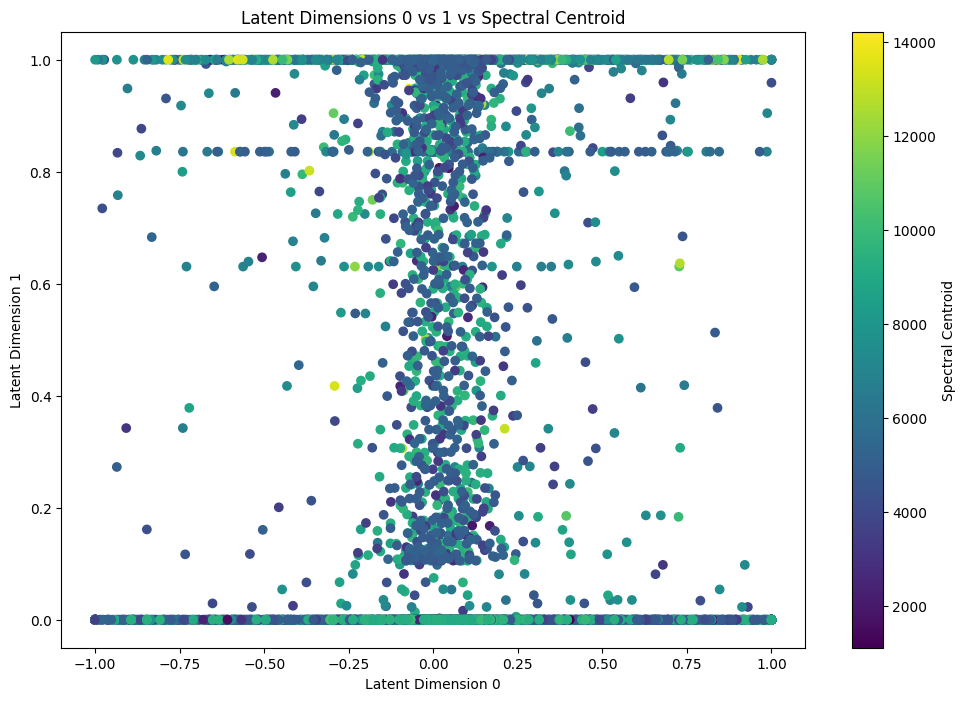

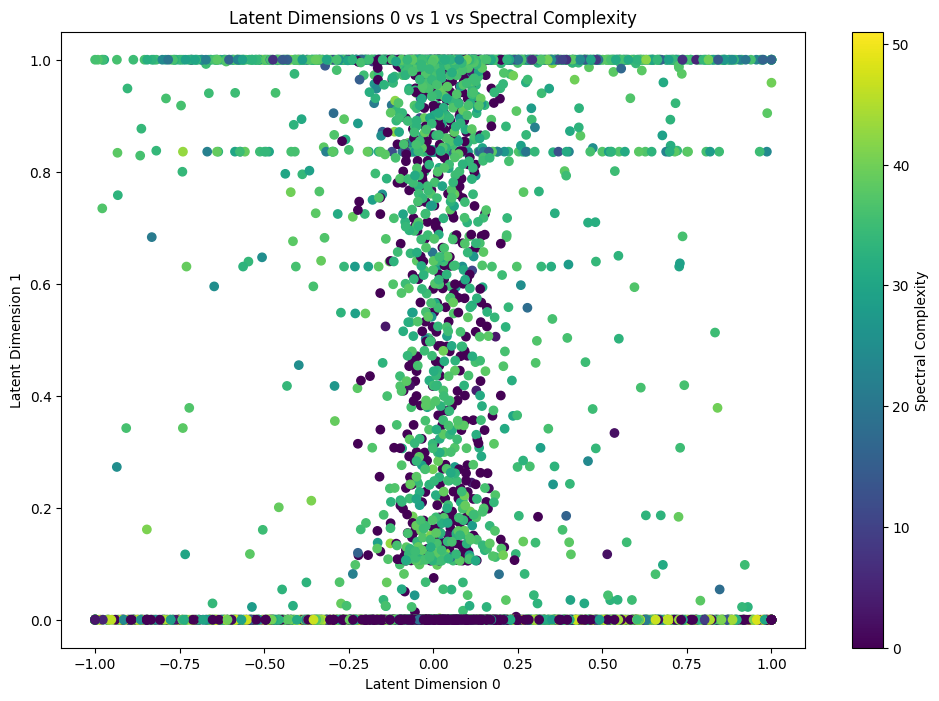

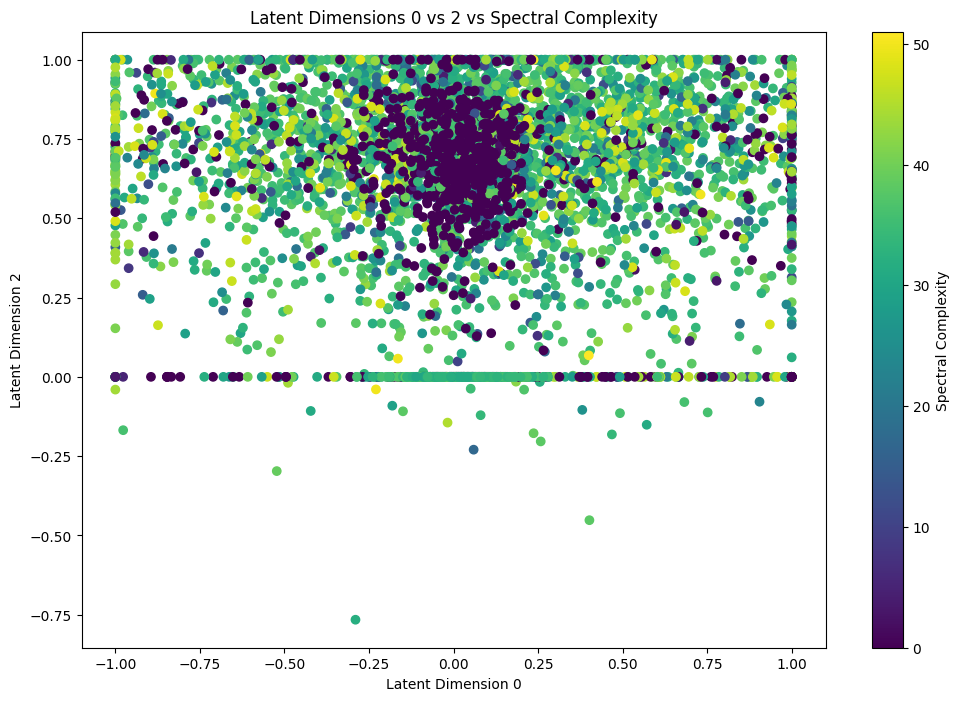

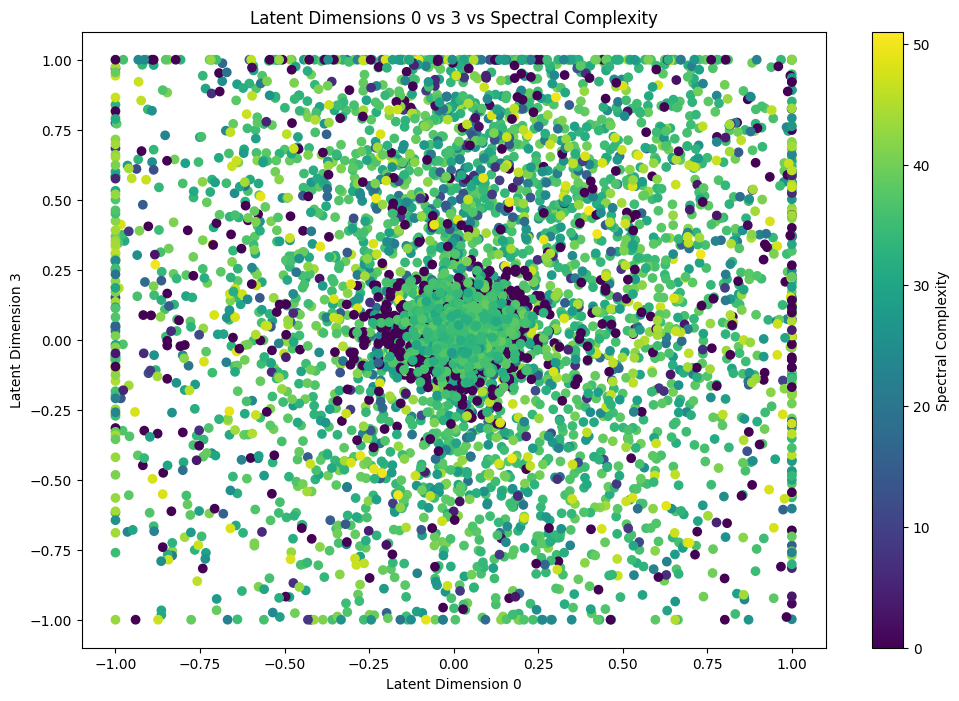

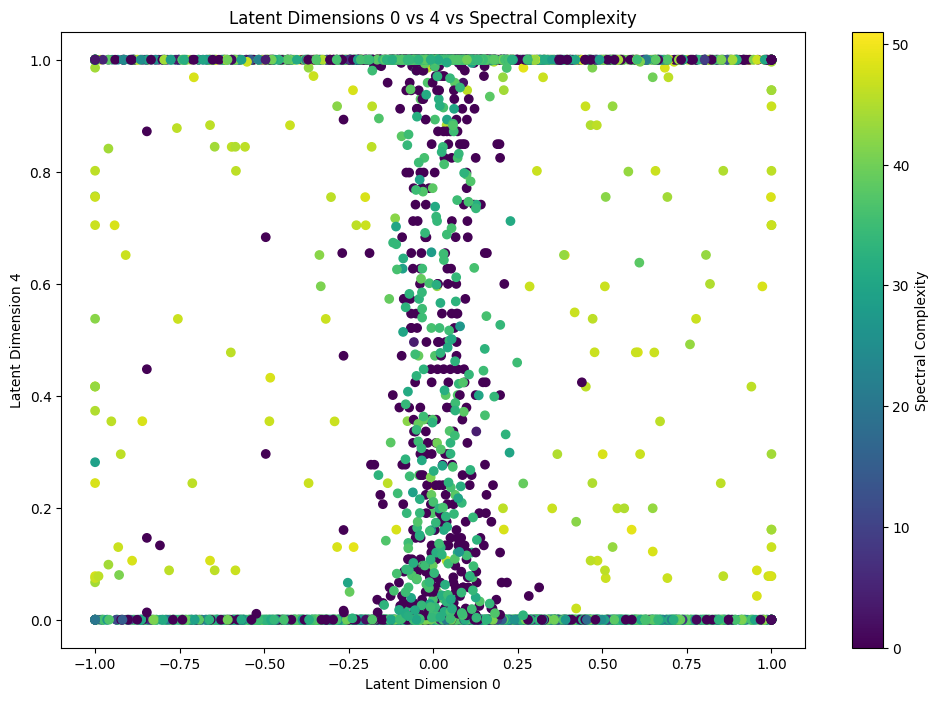

...

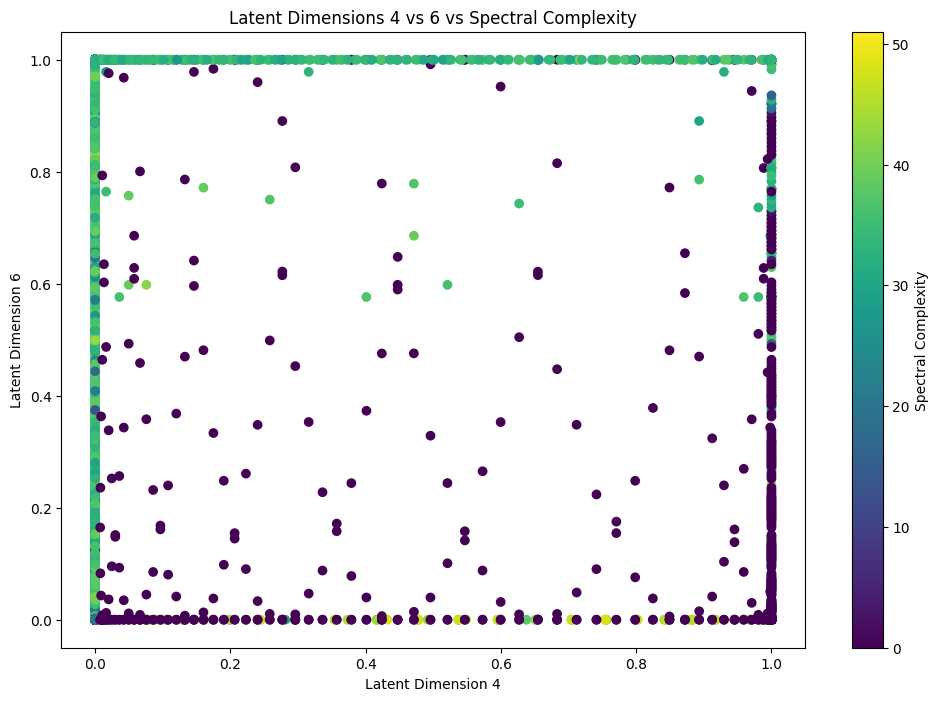

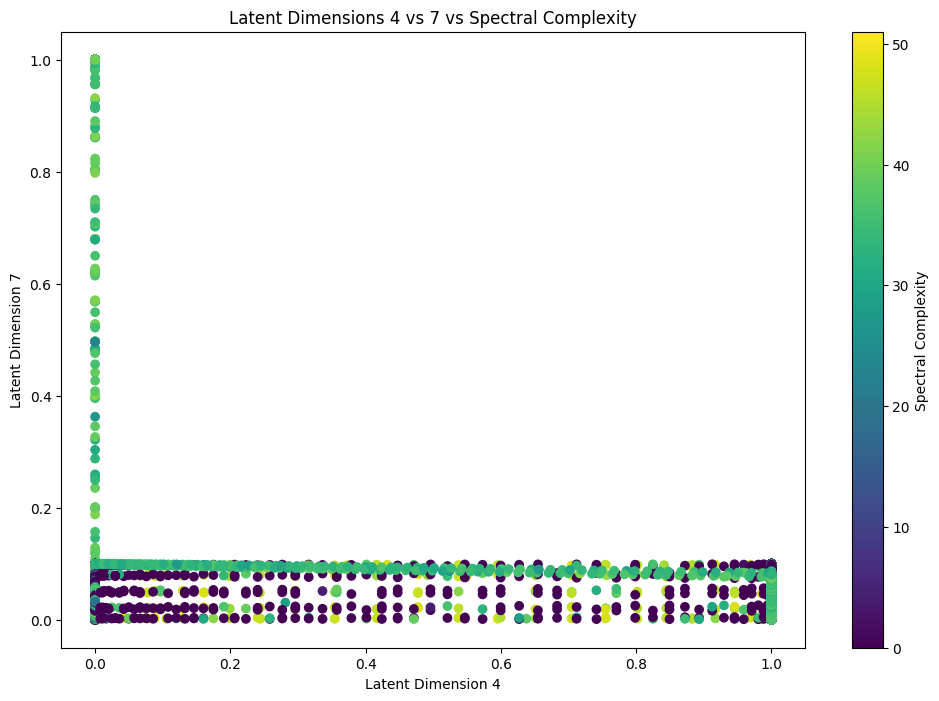

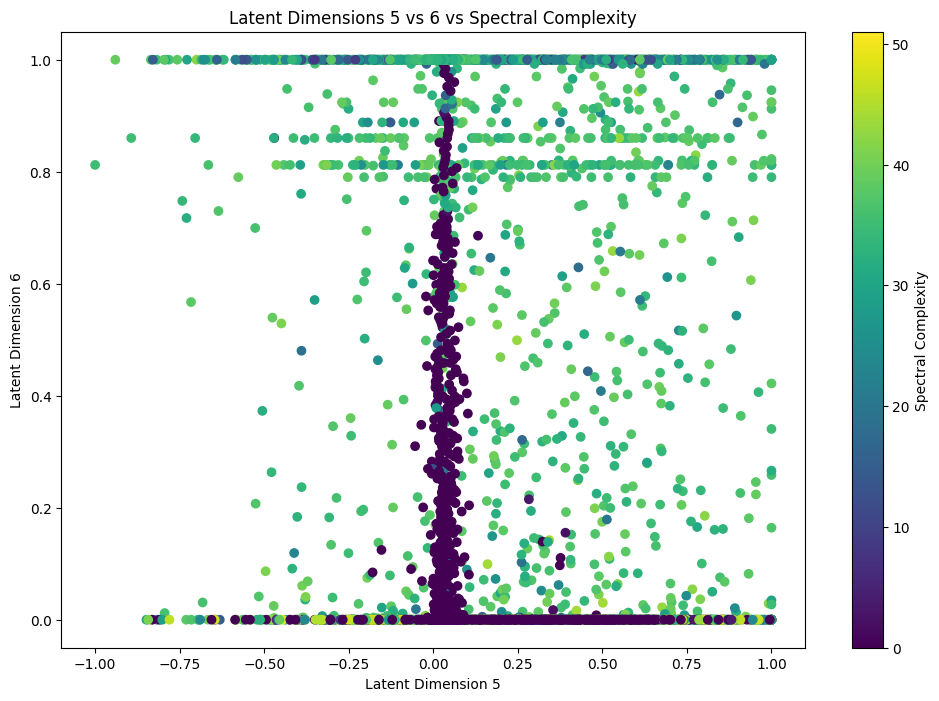

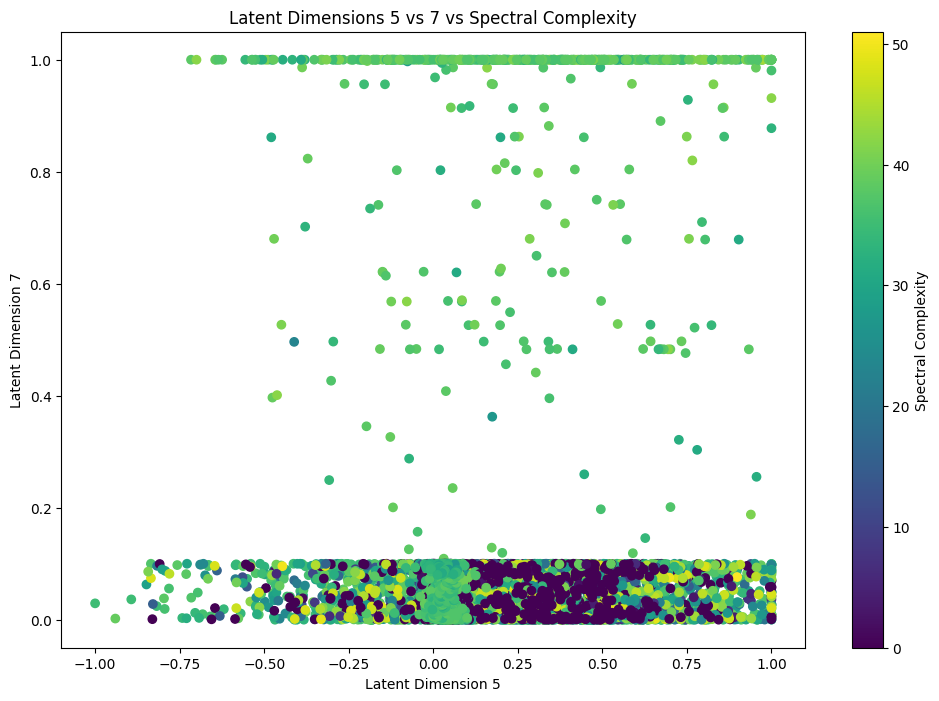

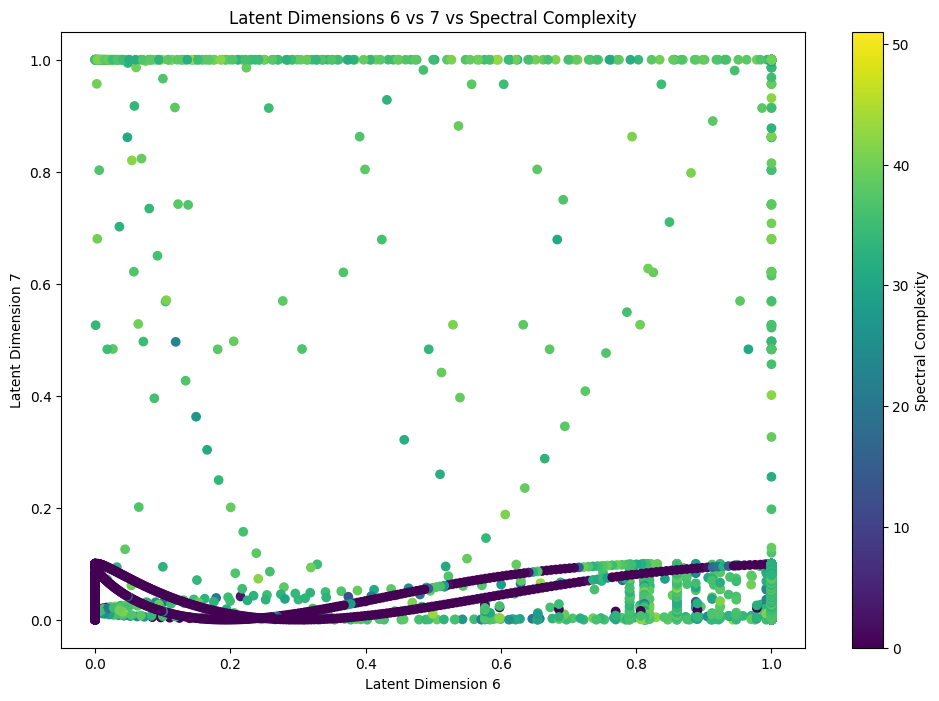

In [103]:
def extract_latent_dimensions_and_feature(file_data, feature_key, dim1_idx=0, dim2_idx=1):
    latent_dim1 = []
    latent_dim2 = []
    feature_values = []

    if len(file_data["latents"]) >= max(dim1_idx, dim2_idx) + 1:
        latent_dim1.extend(file_data["latents"][dim1_idx])
        latent_dim2.extend(file_data["latents"][dim2_idx])
        feature_values.extend(file_data[feature_key])

    # Convert lists to numpy arrays for plotting
    latent_dim1 = np.array(latent_dim1)
    latent_dim2 = np.array(latent_dim2)
    feature_values = np.array(feature_values)

    return latent_dim1, latent_dim2, feature_values

def plot_latent_dimensions_vs_feature(latent_dim1, latent_dim2, feature_values, feature_name, dim1_idx, dim2_idx):
    # Create the scatter plot
    plt.figure(figsize=(12, 8))
    scatter = plt.scatter(latent_dim1, latent_dim2, c=feature_values, cmap='viridis')
    plt.colorbar(scatter, label=feature_name)
    plt.xlabel(f'Latent Dimension {dim1_idx}')
    plt.ylabel(f'Latent Dimension {dim2_idx}')
    plt.title(f'Latent Dimensions {dim1_idx} vs {dim2_idx} vs {feature_name}')
    plt.show()

# Example usage:
file_data = data[0]  # Assuming data is already populated as per the previous code
latent_dim1, latent_dim2, feature_values = extract_latent_dimensions_and_feature(file_data, 'spectral_centroid', dim1_idx=0, dim2_idx=1)
plot_latent_dimensions_vs_feature(latent_dim1, latent_dim2, feature_values, 'Spectral Centroid', dim1_idx=0, dim2_idx=1)

# trying all the combinations of the 8 latent dimensions
for i in range(8):
    for j in range(i+1, 8):
        latent_dim1, latent_dim2, feature_values = extract_latent_dimensions_and_feature(file_data, 'spectral_complexity', dim1_idx=i, dim2_idx=j)
        plot_latent_dimensions_vs_feature(latent_dim1, latent_dim2, feature_values, 'Spectral Complexity', dim1_idx=i, dim2_idx=j)





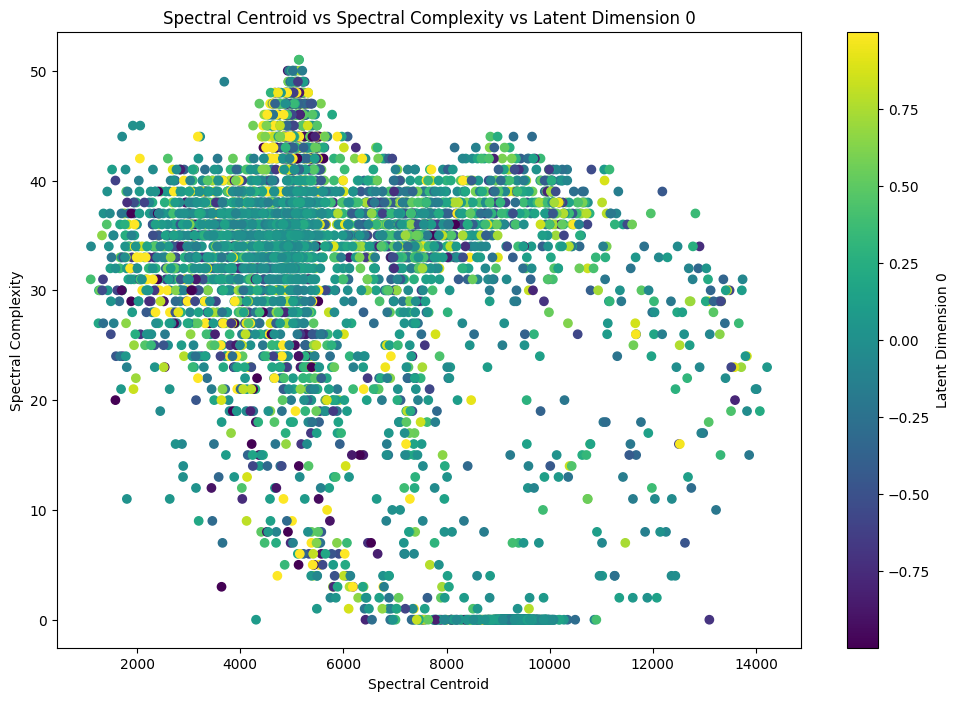

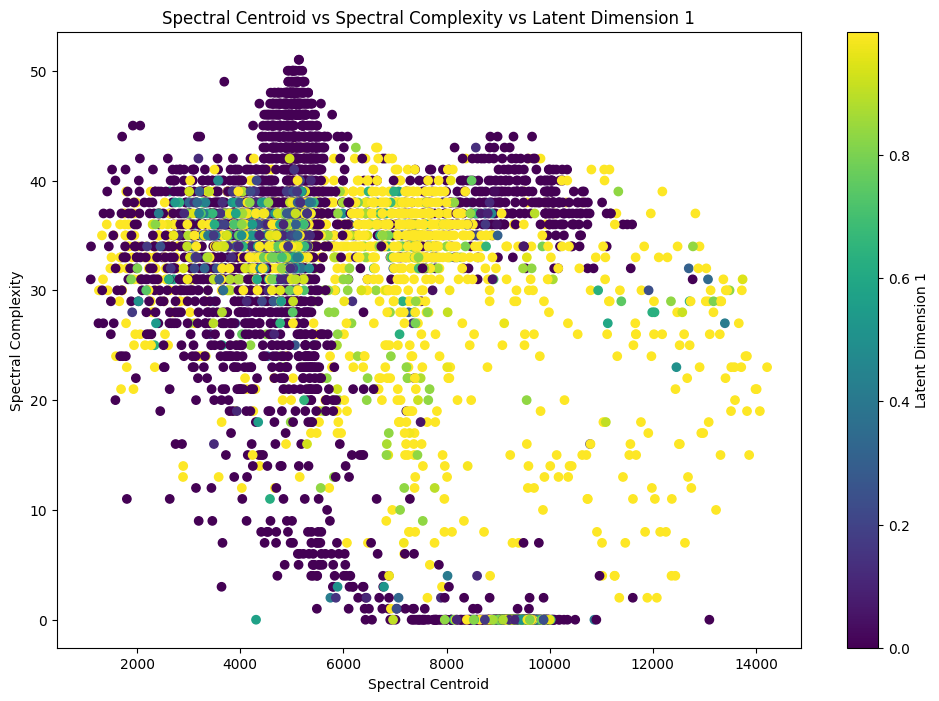

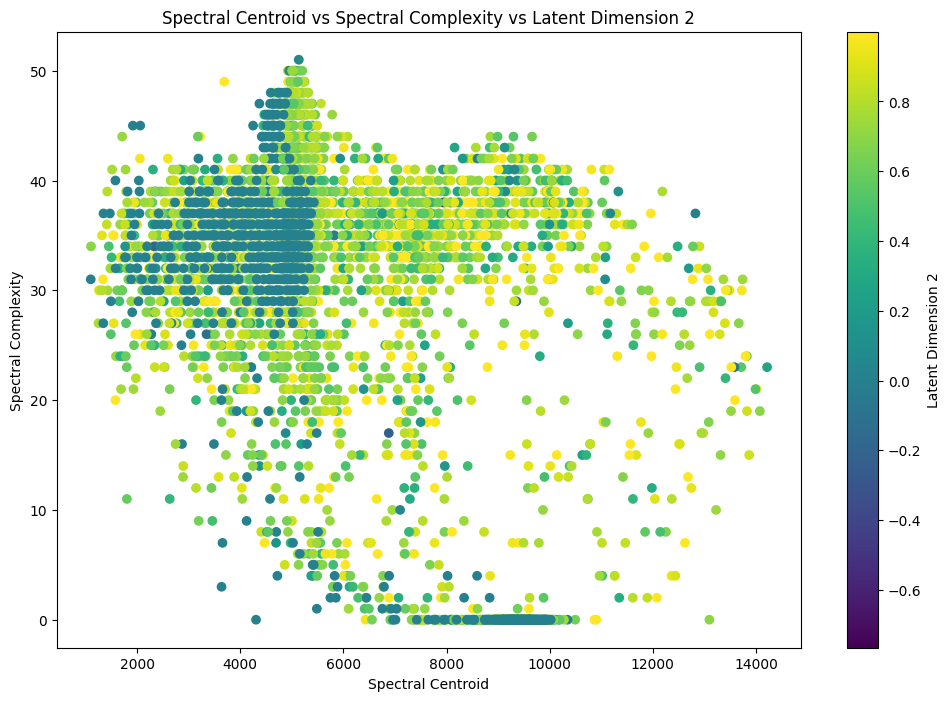

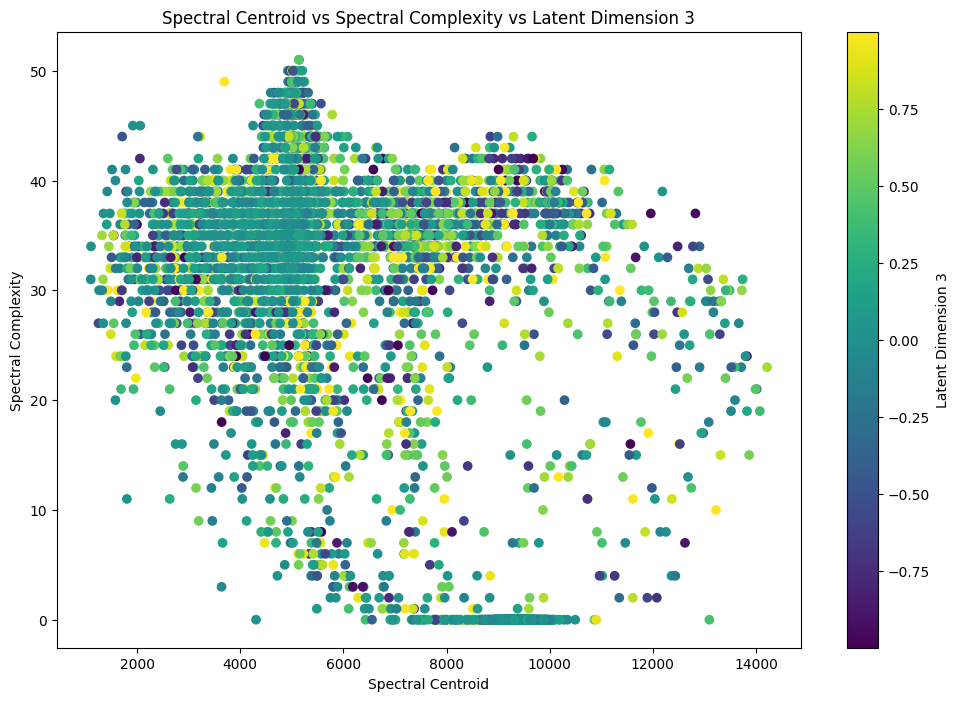

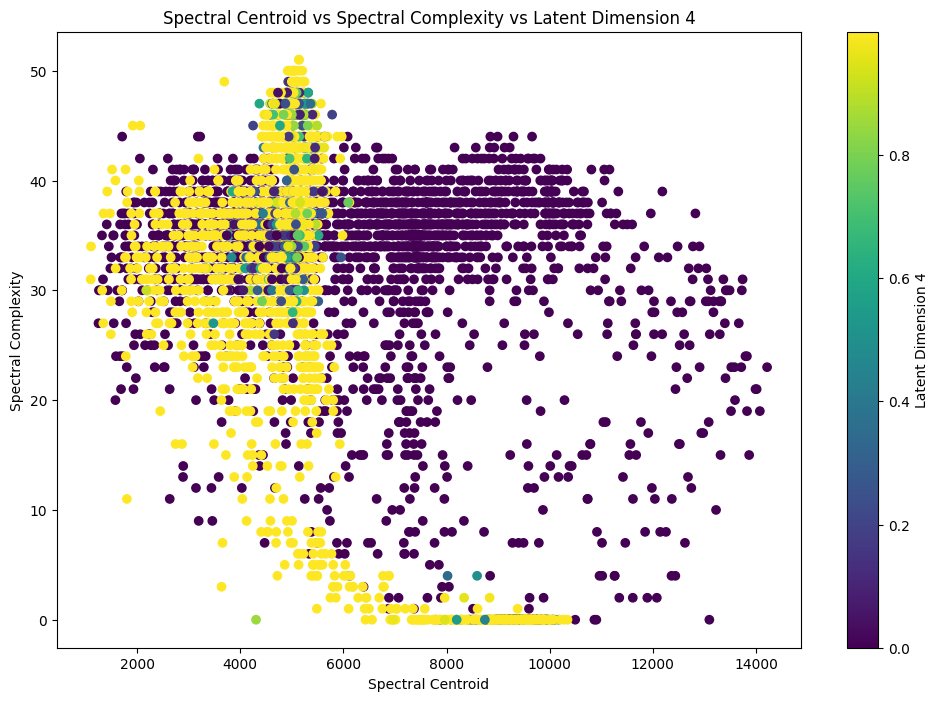

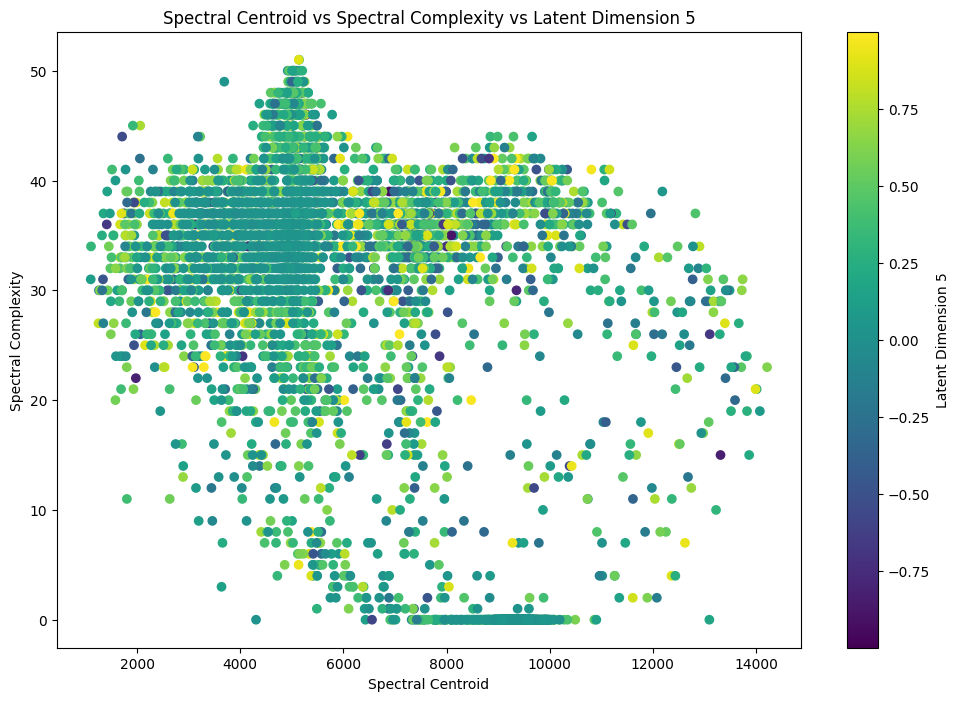

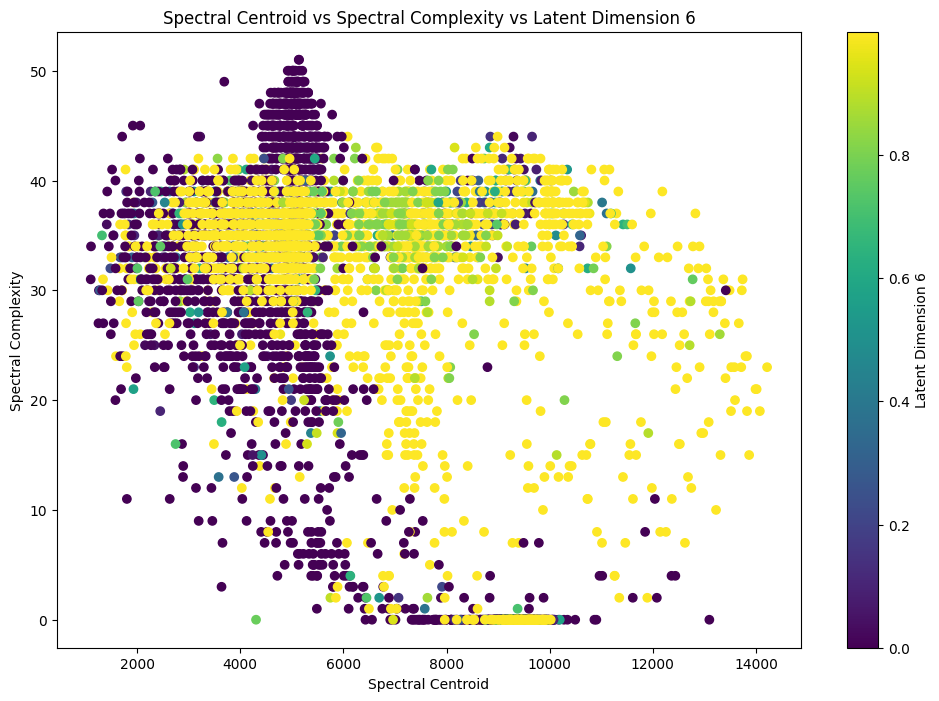

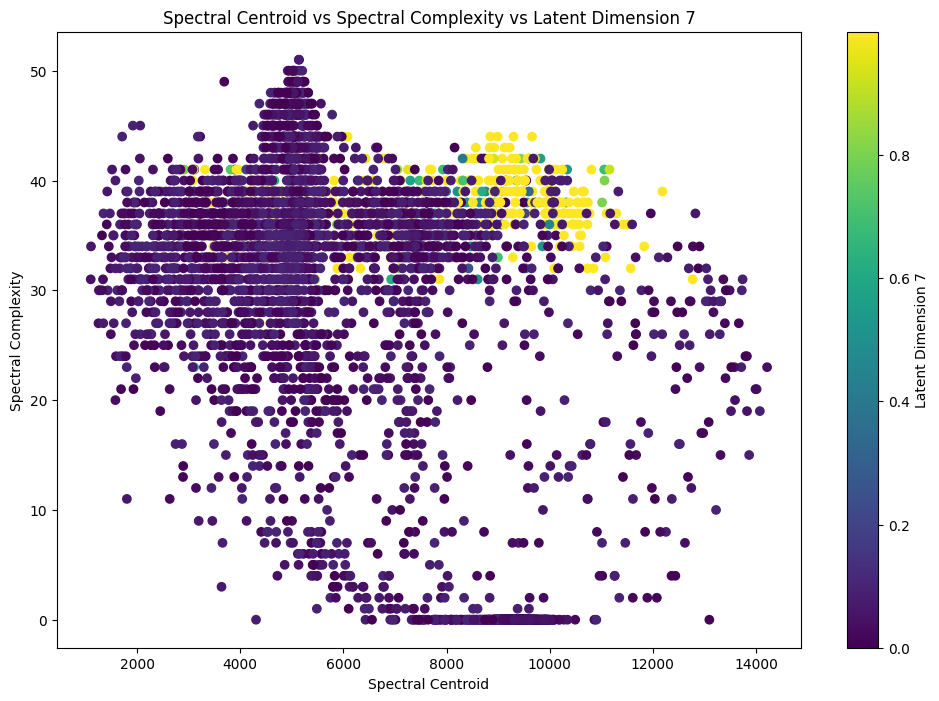

In [100]:
def extract_latent_dimension_and_features(file_data, feature_key_1, feature_key_2, dim_idx=0):
    latent_dim = []
    feature_values_1 = []
    feature_values_2 = []

    if len(file_data["latents"]) >= dim_idx + 1:
        latent_dim.extend(file_data["latents"][dim_idx])
        feature_values_1.extend(file_data[feature_key_1])
        feature_values_2.extend(file_data[feature_key_2])

    # Convert lists to numpy arrays for plotting
    latent_dim = np.array(latent_dim)
    feature_values_1 = np.array(feature_values_1)
    feature_values_2 = np.array(feature_values_2)

    return latent_dim, feature_values_1, feature_values_2

def plot_latent_dimension_vs_features(latent_dim, feature_values_1, feature_values_2, feature_name_1, feature_name_2, dim_idx):
    # Create the scatter plot
    plt.figure(figsize=(12, 8))
    scatter = plt.scatter(feature_values_1, feature_values_2, c=latent_dim, cmap='viridis')
    plt.colorbar(scatter, label=f'Latent Dimension {dim_idx}')
    plt.xlabel(feature_name_1)
    plt.ylabel(feature_name_2)
    plt.title(f'{feature_name_1} vs {feature_name_2} vs Latent Dimension {dim_idx}')
    plt.show()

# Example usage:
file_data = data[0]  # Assuming data is already populated as per the previous code
latent_dim, feature_values_1, feature_values_2 = extract_latent_dimension_and_features(file_data, 'spectral_centroid', 'spectral_complexity', dim_idx=0)
plot_latent_dimension_vs_features(latent_dim, feature_values_1, feature_values_2, 'Spectral Centroid', 'Spectral Complexity', dim_idx=0)

latent_dim, feature_values_1, feature_values_2 = extract_latent_dimension_and_features(file_data, 'spectral_centroid', 'spectral_complexity', dim_idx=1)
plot_latent_dimension_vs_features(latent_dim, feature_values_1, feature_values_2, 'Spectral Centroid', 'Spectral Complexity', dim_idx=1)

latent_dim, feature_values_1, feature_values_2 = extract_latent_dimension_and_features(file_data, 'spectral_centroid', 'spectral_complexity', dim_idx=2)
plot_latent_dimension_vs_features(latent_dim, feature_values_1, feature_values_2, 'Spectral Centroid', 'Spectral Complexity', dim_idx=2)

latent_dim, feature_values_1, feature_values_2 = extract_latent_dimension_and_features(file_data, 'spectral_centroid', 'spectral_complexity', dim_idx=3)
plot_latent_dimension_vs_features(latent_dim, feature_values_1, feature_values_2, 'Spectral Centroid', 'Spectral Complexity', dim_idx=3)

latent_dim, feature_values_1, feature_values_2 = extract_latent_dimension_and_features(file_data, 'spectral_centroid', 'spectral_complexity', dim_idx=4)
plot_latent_dimension_vs_features(latent_dim, feature_values_1, feature_values_2, 'Spectral Centroid', 'Spectral Complexity', dim_idx=4)

latent_dim, feature_values_1, feature_values_2 = extract_latent_dimension_and_features(file_data, 'spectral_centroid', 'spectral_complexity', dim_idx=5)
plot_latent_dimension_vs_features(latent_dim, feature_values_1, feature_values_2, 'Spectral Centroid', 'Spectral Complexity', dim_idx=5)

latent_dim, feature_values_1, feature_values_2 = extract_latent_dimension_and_features(file_data, 'spectral_centroid', 'spectral_complexity', dim_idx=6)
plot_latent_dimension_vs_features(latent_dim, feature_values_1, feature_values_2, 'Spectral Centroid', 'Spectral Complexity', dim_idx=6)

latent_dim, feature_values_1, feature_values_2 = extract_latent_dimension_and_features(file_data, 'spectral_centroid', 'spectral_complexity', dim_idx=7)
plot_latent_dimension_vs_features(latent_dim, feature_values_1, feature_values_2, 'Spectral Centroid', 'Spectral Complexity', dim_idx=7)
